In [1]:
!nvidia-smi

Wed Jan  4 02:47:14 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.01    Driver Version: 470.82.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# 1. Installation

## MMDetection github
**google mmdetection 검색**
- https://github.com/open-mmlab/mmdetection


## Install 절차
**installation 링크**
- https://github.com/open-mmlab/mmdetection/blob/master/docs/en/get_started.md/#Installation

### Step 1. Install MMCV using MIM.

In [2]:
!pip3 install openmim
!mim install mmcv-full

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 200.3 kB/s eta 0:00:00a 0:00:01
Looking in links: https://download.openmmlab.com/mmcv/dist/cu110/torch1.11.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 605.4/605.4 kB 756.1 kB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for mmcv-full: filename=mmcv_full-1.7.1-cp37-cp37m-linux_x86_64.whl size=29921384 sha256=82192a76e95af6dcd438e61da372e71c87a1533d283f5bef12154a241ed41d06
  Stored in directory: /root/.cache/pip/wheels/27/d5/67/e59eb8b14401d1ac087a8a03641951cb4e32d09a23c62b7265
Successfully built mmcv-full


### Step 2. Install MMDetection from the source.

In [3]:
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -e .

Cloning into 'mmdetection'...
remote: Enumerating objects: 33286, done.
remote: Counting objects: 100% (103/103), done.
remote: Compressing objects: 100% (94/94), done.
remote: Total 33286 (delta 19), reused 68 (delta 8), pack-reused 33183
Receiving objects: 100% (33286/33286), 45.20 MiB | 11.28 MiB/s, done.
Resolving deltas: 100% (23505/23505), done.
/kaggle/working/mmdetection
Obtaining file:///kaggle/working/mmdetection
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pycocotools: filename=pycocotools-2.0.6-cp37-cp37m-linux_x86_64.whl size=373762 sha256=a18ba03e73791f7a204d420d0d0af5080a29df3907b5e7883c81ce59cb56b189
  Stored in directory: /root/.cache/pip/wheels/06/f6/f9/9cc49c6de8e3cf27dfddd91bf46595a057141d4583a2adaf03
Successfully built pycocotools
  Running setup.py develop for mmdet


### Step 3. Verification

In [4]:
import mmdet
print(mmdet.__version__)
# Example output: 2.26.0

2.27.0


/opt/conda/lib/python3.7/site-packages/mmcv/__init__.py:21: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  'On January 1, 2023, MMCV will release v2.0.0, in which it will remove '


### Step 4. Inference
- github home에서 Overview of Benchmark and Model Zoo 섹션 확인
- https://github.com/open-mmlab/mmdetection/tree/master/configs/yolo

In [5]:
!mim download mmdet --config yolov3_mobilenetv2_320_300e_coco --dest .

/opt/conda/lib/python3.7/site-packages/mmcv/__init__.py:21: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  'On January 1, 2023, MMCV will release v2.0.0, in which it will remove '
processing yolov3_mobilenetv2_320_300e_coco...
downloading ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MiB 2.6 MB/s eta 0:00:0000:0100:01
Successfully downloaded yolov3_mobilenetv2_320_300e_coco_20210719_215349-d18dff72.pth to /kaggle/working/mmdetection
Successfully dumped yolov3_mobilenetv2_320_300e_coco.py to /kaggle/working/mmdetection


In [6]:
from mmdet.apis import init_detector, inference_detector

config_file = 'yolov3_mobilenetv2_320_300e_coco.py'
checkpoint_file = 'yolov3_mobilenetv2_320_300e_coco_20210719_215349-d18dff72.pth'
model = init_detector(config_file, checkpoint_file, device='cpu')  # or device='cuda:0'
inference_detector(model, 'demo/demo.jpg')

load checkpoint from local path: yolov3_mobilenetv2_320_300e_coco_20210719_215349-d18dff72.pth


[array([[5.12588043e+01, 1.13287674e+02, 6.75582886e+01, 1.32954651e+02,
         5.93155511e-02],
        [5.45404846e+02, 1.11175240e+02, 5.58186951e+02, 1.24366745e+02,
         5.03071770e-02],
        [3.66082550e+02, 1.23854057e+02, 3.81954681e+02, 1.45346939e+02,
         4.83218916e-02],
        [4.92554932e+01, 1.18862122e+02, 6.38435516e+01, 1.42556534e+02,
         4.66164015e-02],
        [5.28772766e+02, 1.10966637e+02, 5.40577209e+02, 1.23876961e+02,
         3.13960239e-02],
        [4.50718292e+02, 1.01557205e+02, 4.62131439e+02, 1.10339996e+02,
         2.94490792e-02],
        [2.09123947e+02, 9.55709305e+01, 2.23539291e+02, 1.06074486e+02,
         2.49082260e-02],
        [3.54278015e+02, 1.14047302e+02, 3.68170349e+02, 1.26227058e+02,
         2.37889681e-02],
        [2.86970093e+02, 1.19910118e+02, 3.04447571e+02, 1.50397385e+02,
         1.87798031e-02],
        [2.17763092e+02, 1.62588028e+02, 4.57619904e+02, 3.39809723e+02,
         1.80731602e-02],
        [1

# Train A Detector on A Customized Dataset
- github의 demo 디렉토리 아래 [MMDet_Tutorial.ipynb](https://github.com/open-mmlab/mmdetection/blob/master/demo/MMDet_Tutorial.ipynb) 파일 참조 

### Oxford Pet Dataset 다운로드
* [The Oxford-IIIT Pet Dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/) 
* Image당 Object가 1개가 있어서 Classification 문제로도 사용됨
* 37개 품종 분류 (품종당 200장 정도 데이터) : Dataset Statistics 확인

In [7]:
# download the data
# files: images.tar.gz (dataset) and annotations.tar.gz (groundtruth data).
!wget https://thor.robots.ox.ac.uk/~vgg/data/pets/images.tar.gz
!wget https://thor.robots.ox.ac.uk/~vgg/data/pets/annotations.tar.gz

--2023-01-04 03:11:57--  https://thor.robots.ox.ac.uk/~vgg/data/pets/images.tar.gz
Resolving thor.robots.ox.ac.uk (thor.robots.ox.ac.uk)... 129.67.95.98
Connecting to thor.robots.ox.ac.uk (thor.robots.ox.ac.uk)|129.67.95.98|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 791918971 (755M) [application/octet-stream]
Saving to: ‘images.tar.gz’

images.tar.gz       100%[===================>] 755.23M  10.9MB/s    in 73s     

2023-01-04 03:13:12 (10.3 MB/s) - ‘images.tar.gz’ saved [791918971/791918971]

--2023-01-04 03:13:13--  https://thor.robots.ox.ac.uk/~vgg/data/pets/annotations.tar.gz
Resolving thor.robots.ox.ac.uk (thor.robots.ox.ac.uk)... 129.67.95.98
Connecting to thor.robots.ox.ac.uk (thor.robots.ox.ac.uk)|129.67.95.98|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19173078 (18M) [application/octet-stream]
Saving to: ‘annotations.tar.gz’

annotations.tar.gz  100%[===================>]  18.28M  5.71MB/s    in 3.2s    

2023-01-04 

In [9]:
# decompress the data
!mkdir ./oxford_pet
!tar -xvf images.tar.gz -C ./oxford_pet
!tar -xvf annotations.tar.gz -C ./oxford_pet

images/
images/boxer_16.jpg
images/chihuahua_165.jpg
images/pug_183.jpg
images/english_setter_1.jpg
images/chihuahua_170.jpg
images/english_cocker_spaniel_17.jpg
images/samoyed_39.jpg
images/Egyptian_Mau_62.jpg
images/samoyed_36.jpg
images/german_shorthaired_3.jpg
images/Ragdoll_183.jpg
images/British_Shorthair_64.jpg
images/american_pit_bull_terrier_57.jpg
images/beagle_120.jpg
images/american_bulldog_174.jpg
images/chihuahua_101.jpg
images/shiba_inu_136.jpg
images/Abyssinian_136.jpg
images/Siamese_201.jpg
images/Abyssinian_85.jpg
images/saint_bernard_145.jpg
images/Siamese_63.jpg
images/leonberger_164.jpg
images/Maine_Coon_126.jpg
images/samoyed_51.jpg
images/Birman_15.jpg
images/english_cocker_spaniel_181.jpg
images/english_cocker_spaniel_128.jpg
images/leonberger_133.jpg
images/english_cocker_spaniel_6.jpg
images/miniature_pinscher_119.jpg
images/american_pit_bull_terrier_27.jpg
images/Abyssinian_37.jpg
images/Bombay_91.jpg
images/Egyptian_Mau_6.jpg
images/Maine_Coon_173.jpg
images

### Oxford Pet Dataset의 디렉토리 구조 보기

In [10]:
# Check the directory structure of the Oxford Pet

# Install tree first
!apt-get -q install tree

Reading package lists...
Building dependency tree...
Reading state information...
tree is already the newest version (1.8.0-1).
0 upgraded, 0 newly installed, 0 to remove and 93 not upgraded.


In [11]:
!tree ./oxford_pet/annotations/xmls

./oxford_pet/annotations/xmls
├── Abyssinian_1.xml
├── Abyssinian_10.xml
├── Abyssinian_100.xml
├── Abyssinian_101.xml
├── Abyssinian_102.xml
├── Abyssinian_103.xml
├── Abyssinian_105.xml
├── Abyssinian_106.xml
├── Abyssinian_107.xml
├── Abyssinian_108.xml
├── Abyssinian_109.xml
├── Abyssinian_11.xml
├── Abyssinian_110.xml
├── Abyssinian_111.xml
├── Abyssinian_112.xml
├── Abyssinian_113.xml
├── Abyssinian_114.xml
├── Abyssinian_115.xml
├── Abyssinian_116.xml
├── Abyssinian_117.xml
├── Abyssinian_118.xml
├── Abyssinian_119.xml
├── Abyssinian_12.xml
├── Abyssinian_120.xml
├── Abyssinian_121.xml
├── Abyssinian_122.xml
├── Abyssinian_123.xml
├── Abyssinian_124.xml
├── Abyssinian_125.xml
├── Abyssinian_126.xml
├── Abyssinian_127.xml
├── Abyssinian_128.xml
├── Abyssinian_129.xml
├── Abyssinian_13.xml
├── Abyssinian_130.xml
├── Abyssinian_131.xml
├── Abyssinian_132.xml
├── Abyssinian_133.xml
├── Abyssinian_134.xml
├── Abyssinian_135.xml
├── Abyssinian_136.xml
├── Abyssinian_137.xml
├── Abyssi

In [ ]:
!tree ./oxford_pet/images

### 이미지와 레이블 보기

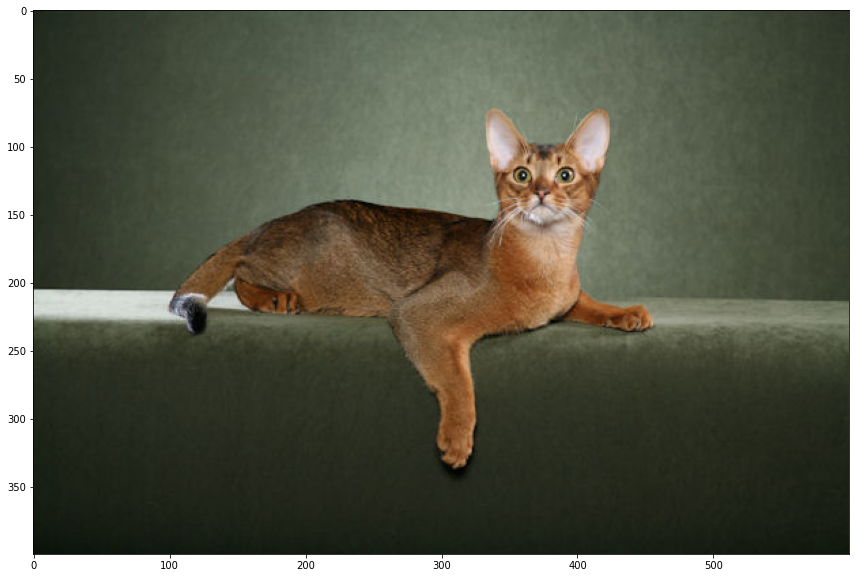

In [12]:
# Let's take a look at the dataset image
import mmcv
import matplotlib.pyplot as plt

img = mmcv.imread('./oxford_pet/images/Abyssinian_1.jpg')
plt.figure(figsize=(15, 10))
plt.imshow(mmcv.bgr2rgb(img))
plt.show()

In [13]:
# Check the label of a single image
!cat ./oxford_pet/annotations/xmls/Abyssinian_1.xml

<annotation><folder>OXIIIT</folder><filename>Abyssinian_1.jpg</filename><source><database>OXFORD-IIIT Pet Dataset</database><annotation>OXIIIT</annotation><image>flickr</image></source><size><width>600</width><height>400</height><depth>3</depth></size><segmented>0</segmented><object><name>cat</name><pose>Frontal</pose><truncated>0</truncated><occluded>0</occluded><bndbox><xmin>333</xmin><ymin>72</ymin><xmax>425</xmax><ymax>158</ymax></bndbox><difficult>0</difficult></object></annotation>


[{'class_name': 'Abyssinian', 'bndbox_coor': (333, 72, 425, 158)}]


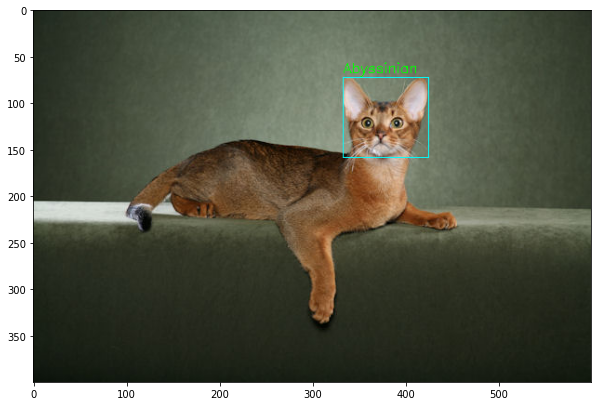

In [14]:
import os
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
img_dir = "./oxford_pet/images/"
xml_file = "./oxford_pet/annotations/xmls/Abyssinian_1.xml"

tree = ET.parse(xml_file)
root = tree.getroot()

img_path = root.find('filename').text
img_full_path = os.path.join(img_dir, img_path)
img = cv2.imread(img_full_path)
dst = img.copy()

objects = root.findall('object')
object_list = []

for obj in objects:
  box = obj.find("bndbox")
  x1 = int(box.find('xmin').text)
  y1 = int(box.find('ymin').text)
  x2 = int(box.find('xmax').text)
  y2 = int(box.find('ymax').text)

  bndbox_coor = (x1, y1, x2, y2)
  class_name = img_path[:img_path.rfind('_')]

  cv2.rectangle(dst, (x1, y1), (x2, y2), color=(255, 255, 0), thickness=1)
  cv2.putText(dst, class_name, (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), thickness=1 )

  object_dict = {'class_name' : class_name, 'bndbox_coor' : bndbox_coor}
  object_list.append(object_dict)

print(object_list)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

Annotation 파일 관련

In [15]:
import pandas as pd
pet_df = pd.read_csv('./oxford_pet/annotations/trainval.txt', sep=' ', header=None,
                     names=["image_name", "class_id", "dummy1", "dummy2" ])
pet_df

,image_name,class_id,dummy1,dummy2
0,Abyssinian_100,1,1,1
1,Abyssinian_101,1,1,1
2,Abyssinian_102,1,1,1
3,Abyssinian_103,1,1,1
4,Abyssinian_104,1,1,1
...,...,...,...,...
3675,yorkshire_terrier_187,37,2,25
3676,yorkshire_terrier_188,37,2,25
3677,yorkshire_terrier_189,37,2,25
3678,yorkshire_terrier_18,37,2,25


In [16]:
pet_df['class_id'].value_counts()

1     100
28    100
21    100
22    100
24    100
25    100
26    100
27    100
29    100
2     100
30    100
31    100
32    100
34    100
35    100
36    100
20    100
19    100
18    100
17    100
3     100
4     100
5     100
6     100
7     100
9     100
10    100
11    100
14    100
15    100
16    100
37    100
33     99
8      96
13     96
23     96
12     93
Name: class_id, dtype: int64

In [17]:
pet_df['class_name'] = pet_df['image_name'].apply(lambda x:x[:x.rfind('_')])
pet_df.head()

,image_name,class_id,dummy1,dummy2,class_name
0,Abyssinian_100,1,1,1,Abyssinian
1,Abyssinian_101,1,1,1,Abyssinian
2,Abyssinian_102,1,1,1,Abyssinian
3,Abyssinian_103,1,1,1,Abyssinian
4,Abyssinian_104,1,1,1,Abyssinian


In [18]:
from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(pet_df, test_size=0.1, stratify=pet_df['class_id'], random_state=42)

In [19]:
print(train_df['class_id'].value_counts(), val_df['class_id'].value_counts())

5     90
20    90
14    90
25    90
30    90
29    90
15    90
21    90
1     90
7     90
17    90
31    90
28    90
11    90
6     90
19    90
34    90
18    90
9     90
2     90
3     90
16    90
32    90
4     90
35    90
10    90
24    90
27    90
26    90
37    90
22    90
36    90
33    89
8     87
13    86
23    86
12    84
Name: class_id, dtype: int64 3     10
4     10
5     10
36    10
22    10
29    10
35    10
34    10
37    10
14    10
24    10
28    10
25    10
32    10
2     10
21    10
30    10
10    10
6     10
17    10
7     10
20    10
19    10
23    10
1     10
33    10
27    10
16    10
31    10
11    10
15    10
18    10
9     10
13    10
26    10
8      9
12     9
Name: class_id, dtype: int64


In [20]:
train_df = train_df.sort_values(by='image_name')
val_df = val_df.sort_values(by='image_name')

In [21]:
# ann_file로 주어지는 메타파일은 가급적이면 소스데이터의 가장 상단 디렉토리에 저장하는 것이 바람직. 
train_df['image_name'].to_csv('./oxford_pet/train.txt', sep=' ', header=False, index=False)
val_df['image_name'].to_csv('./oxford_pet/val.txt', sep=' ', header=False, index=False)

In [22]:
pet_classes_list = pet_df['class_name'].unique().tolist()
print(pet_classes_list)

['Abyssinian', 'american_bulldog', 'american_pit_bull_terrier', 'basset_hound', 'beagle', 'Bengal', 'Birman', 'Bombay', 'boxer', 'British_Shorthair', 'chihuahua', 'Egyptian_Mau', 'english_cocker_spaniel', 'english_setter', 'german_shorthaired', 'great_pyrenees', 'havanese', 'japanese_chin', 'keeshond', 'leonberger', 'Maine_Coon', 'miniature_pinscher', 'newfoundland', 'Persian', 'pomeranian', 'pug', 'Ragdoll', 'Russian_Blue', 'saint_bernard', 'samoyed', 'scottish_terrier', 'shiba_inu', 'Siamese', 'Sphynx', 'staffordshire_bull_terrier', 'wheaten_terrier', 'yorkshire_terrier']


### Oxford Pet Dataset을 Middle Format으로 변환하기

```
[
    {
        'filename': 'a.jpg',
        'width': 1280,
        'height': 720,
        'ann': {
            'bboxes': <np.ndarray> (n, 4) in (x1, y1, x2, y2) order,
            'labels': <np.ndarray> (n, ),
            'bboxes_ignore': <np.ndarray> (k, 4), (optional field)
            'labels_ignore': <np.ndarray> (k, 4) (optional field)
        }
    },
    ...
]
```

- github의 mmdet/datasets 디렉토리 아래 [custom.py](https://github.com/open-mmlab/mmdetection/blob/master/mmdet/datasets/custom.py)에 CustomDataset 클래스 정의
- 새로 정의한 데이터셋이 CustomDataset을 상속받으므로 부모 클래스의 __init__()함수 적용
- 이 클래스 객체를 생성하는 것은 MMDetection Framework 내부에서 하며 이 때 Config에서 설정한 Dataset 관련 내용(이미지, 라벨 등이 위치한 디렉토리)들이 __init__()을 통해 설정되어 있음

In [23]:
def get_bboxes(anno_xml_path, filename):
  tree = ET.parse(anno_xml_path)
  root = tree.getroot()

  objects = root.findall('object')
  object_list = []

  bbox_names = []
  bboxes = []

  for obj in objects:

    bbox_name = filename[:filename.rfind('_')]

    box = obj.find("bndbox")
    x1 = int(box.find('xmin').text)
    y1 = int(box.find('ymin').text)
    x2 = int(box.find('xmax').text)
    y2 = int(box.find('ymax').text)

    bbox_names.append(bbox_name)
    bboxes.append([x1, y1, x2, y2])
  return bbox_names, bboxes

In [24]:
import copy
import os.path as osp

import mmcv
import numpy as np

from mmdet.datasets.builder import DATASETS
from mmdet.datasets.custom import CustomDataset

@DATASETS.register_module(force=True) # 데코레이터를 통해 CustomDataset(OxfordPetDataset)을 MMDetection FWK에 등록, 재등록 실패시 (force=True)
class OxfordPetDataset(CustomDataset):

    pet_classes = pet_df["class_name"].unique().tolist()
    CLASSES = pet_classes
    # 생성자 함수 생성(디버깅용)
    # def __init__(self, data_root, ann_file, img_prefix):
    #     self.data_root = data_root
    #     self.ann_file = osp.join(data_root, ann_file)
    #     self.img_prefix = osp.join(data_root, img_prefix)
      
    #     self.data_infos = self.load_annotations(self.ann_file)    

    def load_annotations(self, ann_file):
        # self.ann_file : ./oxford_pet/train.txt
        # self.img_prefix : ./oxford_pet/images/

        cat2label = {k: i for i, k in enumerate(self.CLASSES)}
        # load image list from file
        image_list = mmcv.list_from_file(self.ann_file)
    
        data_infos = []
        # convert annotations to middle format
        for image_id in image_list:
            filename = f'{self.img_prefix}/{image_id}.jpg'
            image = mmcv.imread(filename)
            height, width = image.shape[:2]
    
            data_info = dict(filename=f'{image_id}.jpg', width=width, height=height)
    
            # load annotations
            label_prefix = self.img_prefix.replace('images', 'annotations')
            anno_xml_path = osp.join(label_prefix, 'xmls/' + str(image_id) + '.xml')
    
            if not os.path.exists(anno_xml_path):
              continue
 
            bbox_names, bboxes = get_bboxes(anno_xml_path, str(image_id) + '.xml')
    
            gt_bboxes = []
            gt_labels = []
            gt_bboxes_ignore = []
            gt_labels_ignore = []
    
            # filter 'DontCare'
            for bbox_name, bbox in zip(bbox_names, bboxes):
                if bbox_name in cat2label:
                    gt_labels.append(cat2label[bbox_name])
                    gt_bboxes.append(bbox)
                else:
                    gt_labels_ignore.append(-1)
                    gt_bboxes_ignore.append(bbox)

            data_anno = dict(
                bboxes=np.array(gt_bboxes, dtype=np.float32).reshape(-1, 4),
                labels=np.array(gt_labels, dtype=np.long),
                bboxes_ignore=np.array(gt_bboxes_ignore,
                                       dtype=np.float32).reshape(-1, 4),
                labels_ignore=np.array(gt_labels_ignore, dtype=np.long))

            data_info.update(ann=data_anno)
            data_infos.append(data_info)

        return data_infos

In [ ]:
# dataset 잘 만들었는지 확인용
# train_ds = OxfordPetDataset(data_root='./data', ann_file='train.txt', img_prefix='images')
# print(train_ds.data_infos[:10])

### Config 파일 수정하기
- 아래 주어진 config 파일은 COCO dataset 기준으로 Faster R-CNN 을 훈련 시키는 설정이므로 Oxford Pet Dataset 에 맞게 수정해야 함

In [25]:
from mmcv import Config
cfg = Config.fromfile('./configs/yolo/yolov3_d53_mstrain-416_273e_coco.py')
print(f'Config:\n{cfg.pretty_text}')

Config:
checkpoint_config = dict(interval=1)
log_config = dict(interval=50, hooks=[dict(type='TextLoggerHook')])
custom_hooks = [dict(type='NumClassCheckHook')]
dist_params = dict(backend='nccl')
log_level = 'INFO'
load_from = None
resume_from = None
workflow = [('train', 1)]
opencv_num_threads = 0
mp_start_method = 'fork'
auto_scale_lr = dict(enable=False, base_batch_size=64)
model = dict(
    type='YOLOV3',
    backbone=dict(
        type='Darknet',
        depth=53,
        out_indices=(3, 4, 5),
        init_cfg=dict(type='Pretrained', checkpoint='open-mmlab://darknet53')),
    neck=dict(
        type='YOLOV3Neck',
        num_scales=3,
        in_channels=[1024, 512, 256],
        out_channels=[512, 256, 128]),
    bbox_head=dict(
        type='YOLOV3Head',
        num_classes=80,
        in_channels=[512, 256, 128],
        out_channels=[1024, 512, 256],
        anchor_generator=dict(
            type='YOLOAnchorGenerator',
            base_sizes=[[(116, 90), (156, 198), (373, 32

### Pretrained 모델 다운로드하기

In [ ]:
%pwd

In [ ]:
# !mkdir checkpoints
# !cp '/content/drive/MyDrive/Classroom/Object Detection/yolov3_d53_mstrain-608_273e_coco_20210518_115020-a2c3acb8.pth' \
# ./checkpoints/

In [26]:
# We download the pre-trained checkpoints for inference and finetuning.
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/yolo/yolov3_d53_mstrain-416_273e_coco/yolov3_d53_mstrain-416_273e_coco-2b60fcd9.pth \
      -O checkpoints/yolov3_d53_mstrain-416_273e_coco-2b60fcd9.pth

--2023-01-04 03:48:09--  https://download.openmmlab.com/mmdetection/v2.0/yolo/yolov3_d53_mstrain-416_273e_coco/yolov3_d53_mstrain-416_273e_coco-2b60fcd9.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.246.24.209, 47.246.24.214, 47.246.24.210, ...
Connecting to download.openmmlab.com (download.openmmlab.com)|47.246.24.209|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248091504 (237M) [application/octet-stream]
Saving to: ‘checkpoints/yolov3_d53_mstrain-416_273e_coco-2b60fcd9.pth’

checkpoints/yolov3_ 100%[===================>] 236.60M  2.56MB/s    in 97s     

2023-01-04 03:49:48 (2.43 MB/s) - ‘checkpoints/yolov3_d53_mstrain-416_273e_coco-2b60fcd9.pth’ saved [248091504/248091504]



In [ ]:
# 학습 수행후 모델 checkpoint 저장할 공간 연결
# !mkdir /content/drive/MyDrive/pet_log

In [27]:
from mmdet.apis import set_random_seed

# Modify dataset type and path
cfg.dataset_type = 'OxfordPetDataset'
cfg.data_root = 'oxford_pet/'

cfg.data.test.type = 'OxfordPetDataset'
cfg.data.test.data_root = 'oxford_pet/'
cfg.data.test.ann_file = 'train.txt'
cfg.data.test.img_prefix = 'images'

cfg.data.train.type = 'OxfordPetDataset'
cfg.data.train.data_root = 'oxford_pet/'
cfg.data.train.ann_file = 'train.txt'
cfg.data.train.img_prefix = 'images'

cfg.data.val.type = 'OxfordPetDataset'
cfg.data.val.data_root = 'oxford_pet/'
cfg.data.val.ann_file = 'val.txt'
cfg.data.val.img_prefix = 'images'

# modify num classes of the model in box head
cfg.model.bbox_head.num_classes = 37
# If we need to finetune a model based on a pre-trained detector, we need to
# use load_from to set the path of checkpoints.
cfg.load_from = 'checkpoints/yolov3_d53_mstrain-416_273e_coco-2b60fcd9.pth'

# Set up working dir to save files and logs.
cfg.work_dir = './pet_log'

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
cfg.optimizer.lr = 0.001/8
cfg.log_config.interval = 10

# max epochs 243 -> 20
cfg.runner.max_epochs = 20

# 학습 시 Batch size 설정(단일 GPU 별 Batch size로 설정됨)
# samples_per_gpu 8 -> 2
cfg.data.samples_per_gpu = 2
cfg.data.workers_per_gpu = 2


cfg.auto_scale_lr.base_batch_size=2

# Change the evaluation metric since we use customized dataset.
cfg.evaluation.metric = 'mAP'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 20 #12
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 20 #12

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.device = 'cuda'
cfg.gpu_ids = range(1)

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]


# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
checkpoint_config = dict(interval=20)
log_config = dict(
    interval=10,
    hooks=[dict(type='TextLoggerHook'),
           dict(type='TensorboardLoggerHook')])
custom_hooks = [dict(type='NumClassCheckHook')]
dist_params = dict(backend='nccl')
log_level = 'INFO'
load_from = 'checkpoints/yolov3_d53_mstrain-416_273e_coco-2b60fcd9.pth'
resume_from = None
workflow = [('train', 1)]
opencv_num_threads = 0
mp_start_method = 'fork'
auto_scale_lr = dict(enable=False, base_batch_size=2)
model = dict(
    type='YOLOV3',
    backbone=dict(
        type='Darknet',
        depth=53,
        out_indices=(3, 4, 5),
        init_cfg=dict(type='Pretrained', checkpoint='open-mmlab://darknet53')),
    neck=dict(
        type='YOLOV3Neck',
        num_scales=3,
        in_channels=[1024, 512, 256],
        out_channels=[512, 256, 128]),
    bbox_head=dict(
        type='YOLOV3Head',
        num_classes=37,
        in_channels=[512, 256, 128],
        out_channels=[1024, 512, 256],
        anchor_g

### Config에서 설정한 OxfordPet Dataset 적용
- build_dataset() 가 호출될 때 MMDetection Framework에서 OxfordPetDataset 클래스 객체를 생성
- load_annotations() 함수가 호출될 때 self.ann_file, self.data_root, self.img_prefix 값이 Config에서 설정한 파일들로 적용되어 있음

In [28]:
from mmdet.datasets import build_dataset

# Build dataset
datasets = [build_dataset(cfg.data.train)]

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:65: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int` for which `np.compat.long` is itself an alias. Doing this will not modify any behaviour and is safe. When replacing `np.long`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:68: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int`

In [ ]:
datasets

### Config에서 설정한 모델 적용

In [30]:
from mmdet.models import build_detector

# Build the detector
model = build_detector(cfg.model)
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

### 학습 수행

In [31]:
from mmdet.apis import train_detector

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True) # validate=True : validation 데이터로 evaluation

2023-01-04 03:50:34,146 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:65: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int` for which `np.compat.long` is itself an alias. Doing this will not modify any behaviour and is safe. When replacing `np.long`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:68: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by i

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 368/368, 37.1 task/s, elapsed: 10s, ETA:     0s
---------------iou_thr: 0.5---------------


2023-01-04 04:57:38,899 - mmdet - INFO - 
+----------------------------+-----+------+--------+-------+
| class                      | gts | dets | recall | ap    |
+----------------------------+-----+------+--------+-------+
| Abyssinian                 | 10  | 93   | 1.000  | 0.925 |
| american_bulldog           | 10  | 92   | 0.900  | 0.484 |
| american_pit_bull_terrier  | 10  | 103  | 0.900  | 0.806 |
| basset_hound               | 10  | 106  | 0.800  | 0.090 |
| beagle                     | 10  | 114  | 1.000  | 0.688 |
| Bengal                     | 10  | 96   | 0.900  | 0.551 |
| Birman                     | 10  | 62   | 1.000  | 0.827 |
| Bombay                     | 9   | 81   | 0.778  | 0.408 |
| boxer                      | 10  | 107  | 0.700  | 0.457 |
| British_Shorthair          | 10  | 72   | 0.900  | 0.606 |
| chihuahua                  | 10  | 88   | 1.000  | 0.871 |
| Egyptian_Mau               | 9   | 96   | 1.000  | 0.637 |
| english_cocker_spaniel     | 10  | 131  |

### 로그 확인하기

In [ ]:
# load tensorboard in colab
%load_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir /content/drive/MyDrive/pet_log

### 학습된 모델로 예측하기

In [32]:
from mmdet.apis import show_result_pyplot

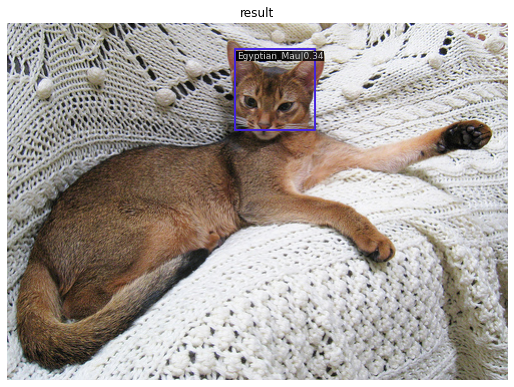

In [42]:
img = mmcv.imread('./oxford_pet/images/Abyssinian_88.jpg')

model.cfg = cfg
result = inference_detector(model, img)
show_result_pyplot(model, img, result)

load checkpoint from local path: ./pet_log/epoch_20.pth


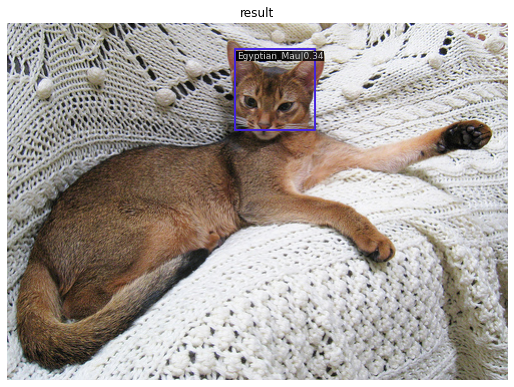

In [43]:
from mmdet.apis import show_result_pyplot

checkpoint_file = './pet_log/epoch_20.pth'

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_detector(cfg, checkpoint_file, device='cuda:0')
img = mmcv.imread('./oxford_pet/images/Abyssinian_88.jpg') # BGR Image 사용 
#model_ckpt.cfg = cfg

result = inference_detector(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, score_thr=0.3)

In [44]:
val_df

,image_name,class_id,dummy1,dummy2,class_name
1895,Abyssinian_1,1,1,1,Abyssinian
14,Abyssinian_113,1,1,1,Abyssinian
20,Abyssinian_119,1,1,1,Abyssinian
1856,Abyssinian_156,1,1,1,Abyssinian
1867,Abyssinian_168,1,1,1,Abyssinian
...,...,...,...,...,...
3639,yorkshire_terrier_154,37,2,25,yorkshire_terrier
3640,yorkshire_terrier_155,37,2,25,yorkshire_terrier
3662,yorkshire_terrier_175,37,2,25,yorkshire_terrier
3676,yorkshire_terrier_188,37,2,25,yorkshire_terrier


In [45]:
Abysn_df = val_df[val_df['class_name'] == 'Abyssinian']
Abysn_img_paths = './oxford_pet/images/' + Abysn_df['image_name'] + '.jpg'
Abysn_img_paths.values

array(['./oxford_pet/images/Abyssinian_1.jpg',
       './oxford_pet/images/Abyssinian_113.jpg',
       './oxford_pet/images/Abyssinian_119.jpg',
       './oxford_pet/images/Abyssinian_156.jpg',
       './oxford_pet/images/Abyssinian_168.jpg',
       './oxford_pet/images/Abyssinian_170.jpg',
       './oxford_pet/images/Abyssinian_179.jpg',
       './oxford_pet/images/Abyssinian_182.jpg',
       './oxford_pet/images/Abyssinian_183.jpg',
       './oxford_pet/images/Abyssinian_191.jpg'], dtype=object)

In [46]:
Abysn_imgs = [mmcv.imread(x) for x in Abysn_img_paths.values]

In [47]:
PET_CLASSES = pet_df['class_name'].unique().tolist()
labels_to_names = {i:k for i, k in enumerate(PET_CLASSES)}

In [48]:
labels_to_names

{0: 'Abyssinian',
 1: 'american_bulldog',
 2: 'american_pit_bull_terrier',
 3: 'basset_hound',
 4: 'beagle',
 5: 'Bengal',
 6: 'Birman',
 7: 'Bombay',
 8: 'boxer',
 9: 'British_Shorthair',
 10: 'chihuahua',
 11: 'Egyptian_Mau',
 12: 'english_cocker_spaniel',
 13: 'english_setter',
 14: 'german_shorthaired',
 15: 'great_pyrenees',
 16: 'havanese',
 17: 'japanese_chin',
 18: 'keeshond',
 19: 'leonberger',
 20: 'Maine_Coon',
 21: 'miniature_pinscher',
 22: 'newfoundland',
 23: 'Persian',
 24: 'pomeranian',
 25: 'pug',
 26: 'Ragdoll',
 27: 'Russian_Blue',
 28: 'saint_bernard',
 29: 'samoyed',
 30: 'scottish_terrier',
 31: 'shiba_inu',
 32: 'Siamese',
 33: 'Sphynx',
 34: 'staffordshire_bull_terrier',
 35: 'wheaten_terrier',
 36: 'yorkshire_terrier'}

Abyssinian 0.90394497
Bengal 0.021412205
Egyptian_Mau 0.2188244
Russian_Blue 0.0038147229


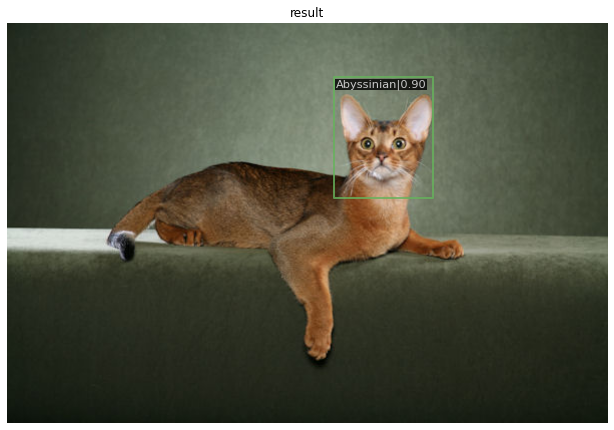

Abyssinian 0.73354185
British_Shorthair 0.0056236936
Egyptian_Mau 0.4489043
Ragdoll 0.14357105
Russian_Blue 0.119070254


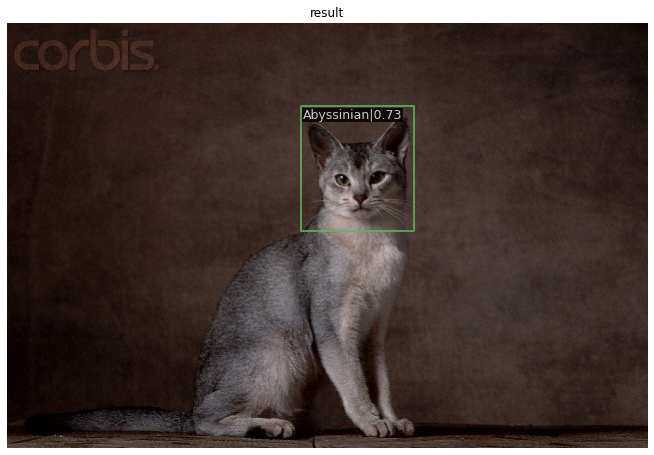

Abyssinian 0.34563
Bengal 0.84948444
Egyptian_Mau 0.64055437
Maine_Coon 0.08513321
Sphynx 0.044974808


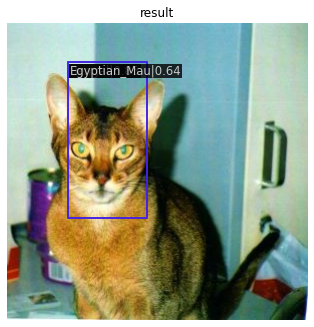

Abyssinian 0.559211
Bengal 0.35625744
Bombay 0.0641067
British_Shorthair 0.07212365
Egyptian_Mau 0.72294176
Russian_Blue 0.0010083406


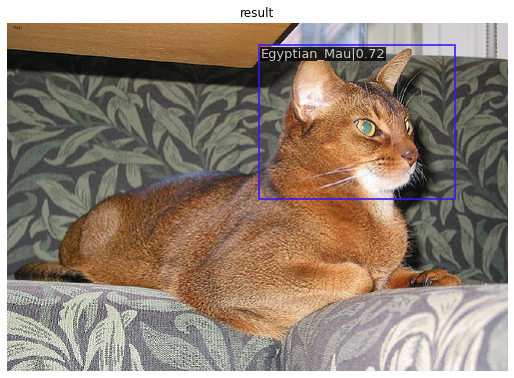

Abyssinian 0.50883013
Bengal 0.58565426
Bombay 0.02378904
chihuahua 0.0021821177
Egyptian_Mau 0.4001962
Maine_Coon 0.3417666
scottish_terrier 0.0471186
Siamese 0.0025074903


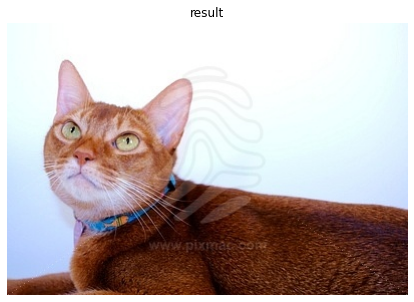

Abyssinian 0.42816576
Bengal 0.4706286
Egyptian_Mau 0.54596597


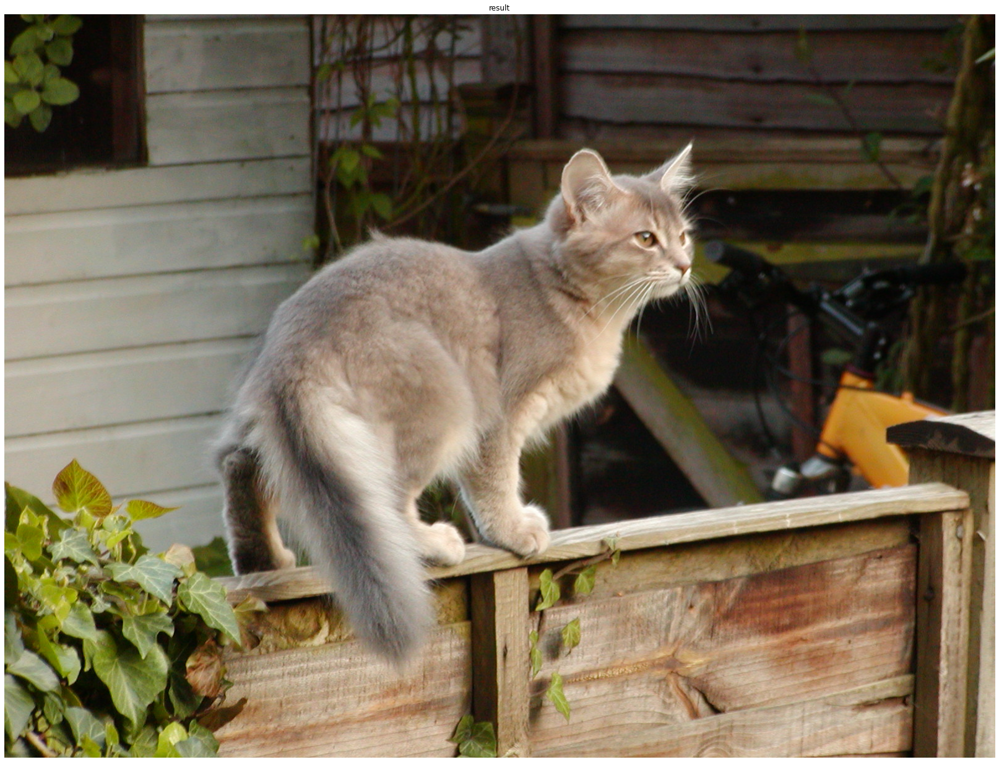

Abyssinian 0.66702104
beagle 0.009101217
Bengal 0.54347277
Bombay 0.03514079
chihuahua 0.031130891
Egyptian_Mau 0.540047
Russian_Blue 0.09464237
Sphynx 0.09316063


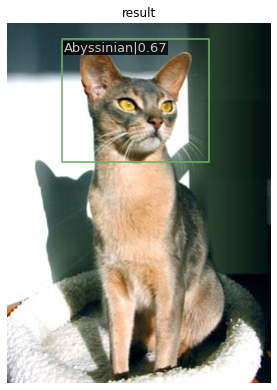

Abyssinian 0.4876729
Bengal 0.904671
Egyptian_Mau 0.5634961
Maine_Coon 0.05125781
Sphynx 0.042508595


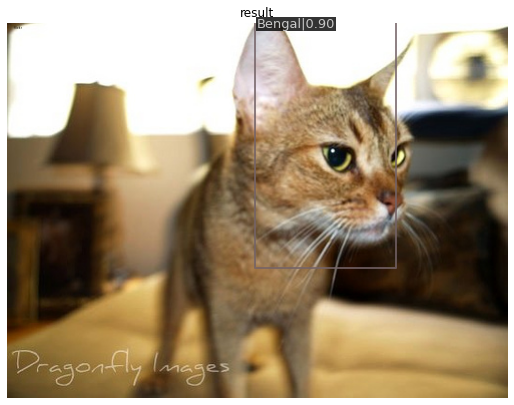

Abyssinian 0.75027704
Bengal 0.7293331
Egyptian_Mau 0.4283969
Maine_Coon 0.0504733


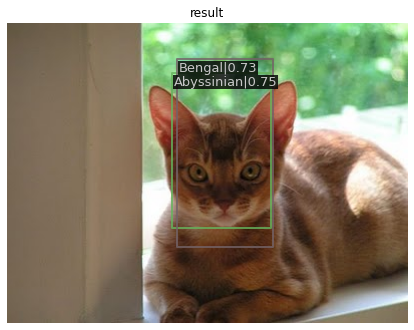

Abyssinian 0.27952838
Bengal 0.90725213
chihuahua 0.0004505396
Egyptian_Mau 0.66509694
Maine_Coon 0.057551727
Sphynx 0.0027391692


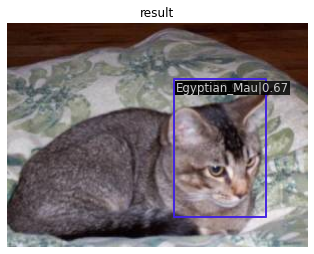

In [49]:
for i in range(len(Abysn_imgs)):
  results = inference_detector(model_ckpt, Abysn_imgs[i])
  for result_ind, result in enumerate(results):
    if result.size == 0:
      continue
    print(labels_to_names[result_ind], result[0][4])
  show_result_pyplot(model_ckpt, Abysn_imgs[i], results, score_thr=0.6)

In [50]:
results

[array([[159.58081   ,  66.34609   , 251.91501   , 183.1392    ,
           0.27952838]], dtype=float32),
 array([], shape=(0, 5), dtype=float32),
 array([], shape=(0, 5), dtype=float32),
 array([], shape=(0, 5), dtype=float32),
 array([], shape=(0, 5), dtype=float32),
 array([[166.00897   ,  56.755825  , 258.13474   , 194.78856   ,
           0.90725213]], dtype=float32),
 array([], shape=(0, 5), dtype=float32),
 array([], shape=(0, 5), dtype=float32),
 array([], shape=(0, 5), dtype=float32),
 array([], shape=(0, 5), dtype=float32),
 array([[1.6104594e+02, 8.0611618e+01, 2.4664842e+02, 2.0128627e+02,
         4.5053961e-04]], dtype=float32),
 array([[166.00897   ,  56.755825  , 258.13474   , 194.78856   ,
           0.66509694]], dtype=float32),
 array([], shape=(0, 5), dtype=float32),
 array([], shape=(0, 5), dtype=float32),
 array([], shape=(0, 5), dtype=float32),
 array([], shape=(0, 5), dtype=float32),
 array([], shape=(0, 5), dtype=float32),
 array([], shape=(0, 5), dtype=float32